**Overview**: In this notebook we explore different classification techniques in the intersection of Computer Vision & Deep Learning. Specifically, we build a convolutional neural network (CNN) for classification, and use transfer learning to boost our classifier's accuracy.

## Setting up

### Connect to Google Drive


In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
DATASETS_PATH = "/content/drive/My Drive/CIS522/HW3_GAN" 
ESCAPED_PATH = DATASETS_PATH.replace(" ", "\\ ") 

In [ ]:
%reload_ext tensorboard

import torch
ROOT_LOG_DIR = "/content/drive/My Drive/CIS522/HW3-GAN/logs"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter
TENSORBOARD_DIR = "Question_1" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:
!7z x {ESCAPED_PATH} # Here we decompress / extract the dataset"

## A Classifier for the Caltech-UCSD Birds 200 Dataset

In this, we are working with the Caltech-UCSD Birds 200 dataset (linked [here](http://www.vision.caltech.edu/visipedia/CUB-200.html)) where we will build your own Dataset / Dataloader / classifier for the dataset.

**Understanding / Using the Data**

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt

input_size = 250
transform = transforms.Compose([transforms.Resize((input_size, input_size)),transforms.ToTensor()]) #,transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_data = ImageFolder("DATASETS/Caltech/train", transform = transform)
val_data = ImageFolder("DATASETS/Caltech/val", transform = transform)

batch_size = 16
train_dataloader = DataLoader(train_data, batch_size= batch_size, shuffle= True)
val_dataloader = DataLoader(val_data, batch_size= batch_size, shuffle= True)

def visualize_data(data, number_of_images = 5):
  fig = plt.figure()
  for i in range(number_of_images):
    img = data[i][0].permute(1,2,0)
    plt.imshow(img)
    plt.show()

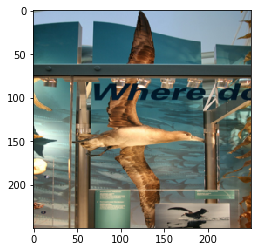

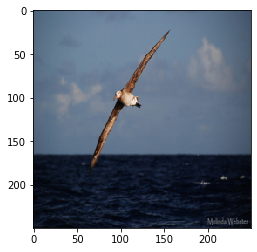

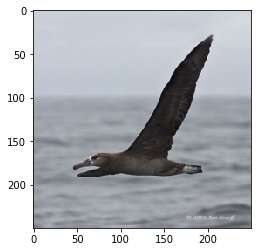

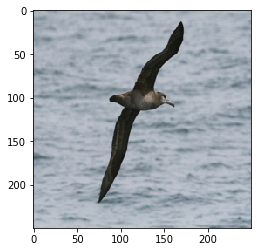

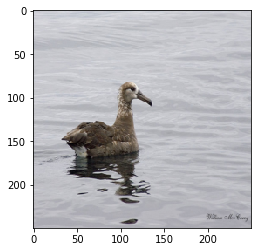

In [ ]:
visualize_data(train_data)

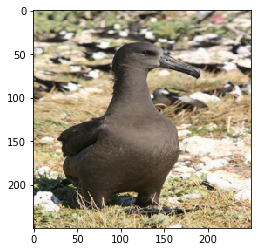

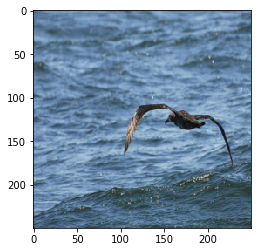

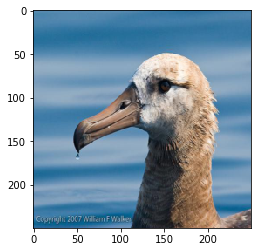

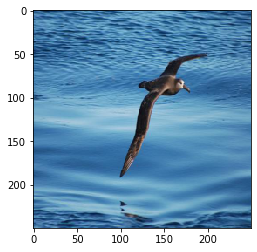

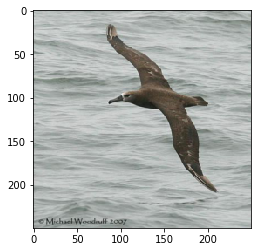

In [ ]:
visualize_data(val_data)

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

def train_model(epochs, train_dataloader, optimizer, loss, net, question):

  net = net.to(device)
  overall_step = 0
  
  for epoch in range(epochs):
    net.train()
    correct = 0
    total = 0
    running_loss = 0.0
    for i,data in enumerate(train_dataloader,0):
      #get the inputs
      inputs,labels = data
      inputs = inputs.to(device)
      labels = labels.to(device)

      #zero the gradients
      optimizer.zero_grad()

      #get output
      outputs = net(inputs)
      _,pred_label = torch.max(outputs,1)
      correct += (pred_label == labels).sum().item()
      loss_1 = loss(outputs,labels)
      loss_1.backward()
      optimizer.step()
      overall_step += 1
      running_loss += loss_1.item()
      total += labels.size(0)

      logger.add_scalar('training loss ' + question, loss_1.item(), overall_step)
    # import pdb; pdb.set_trace()
    print("Epoch %d , Acc = %.3f Loss = %.3f" % (epoch + 1, correct/total, running_loss/total)) 

In [ ]:
def test_model(test_dataloader, net):
  
  correct = 0
  total = 0
  # net = net.to(device)
  net.eval()
  with torch.no_grad():
    for data in test_dataloader:
      inputs,labels = data
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = net(inputs)
      _,pred_label = torch.max(outputs,1)
      correct += (pred_label == labels).sum().item()
      total += labels.size(0)
    print("test accuracy = ", correct/total)
  # return (correct/total)*100

**Logistic Regression Classification**

Using PyTorch we create a Logistic Regression model to classify the Bird Datset.

In [ ]:
class LogisticRegression(torch.nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LogisticRegression, self).__init__()

        self.fc=nn.Linear(input_dim,output_dim)
        pass

    def forward(self, x):

      x=x.view(-1, 3 * 250 * 250)
      y=torch.sigmoid(self.fc(x))
      return y

In [ ]:
learning_rate = 0.00001

model1 = LogisticRegression(187500, 195)
loss = nn.CrossEntropyLoss() 
optimizer = optim.Adam(model1.parameters(), lr = learning_rate)


train_model(5, train_dataloader, optimizer, loss, model1, "logisticFinal1")

Epoch 1 , Acc = 0.003 Loss = 0.331
Epoch 2 , Acc = 0.009 Loss = 0.330
Epoch 3 , Acc = 0.007 Loss = 0.329
Epoch 4 , Acc = 0.007 Loss = 0.328
Epoch 5 , Acc = 0.009 Loss = 0.328


In [ ]:
test_model(val_dataloader, model1)

test accuracy =  0.0053404539385847796


In [ ]:
%tensorboard --logdir {ROOT_LOG_DIR.replace(" ", "\\ ")}

**Feed Forward Neural Network Classification**

Here, we create a Feed Forward neural network to classify the Bird Dataset. 

In [ ]:
class MLP(torch.nn.Module):
  def __init__(self):
    super(MLP, self).__init__()

    self.fc1=nn.Linear(187500,2400)
    # self.fc2=nn.Linear(2400,600)
    # self.fc3=nn.Linear(600,100)
    self.fc4 = nn.Linear(2400,195)
    pass

  def forward(self, x):

    x=x.view(-1, 3 * 250 * 250)
    x=F.relu(self.fc1(x))
    # x=F.relu(self.fc2(x))
    # x = F.relu(self.fc3(x))
    y=torch.sigmoid(self.fc4(x))
    return y

In [ ]:
learning_rate = 0.00001

model2 = MLP()
loss = nn.CrossEntropyLoss() 
optimizer = optim.Adam(model2.parameters(), lr = learning_rate)


train_model(5, train_dataloader, optimizer, loss, model2,"mlpFinal")

Epoch 1 , Acc = 0.005 Loss = 0.335
Epoch 2 , Acc = 0.005 Loss = 0.330
Epoch 3 , Acc = 0.006 Loss = 0.328
Epoch 4 , Acc = 0.005 Loss = 0.326
Epoch 5 , Acc = 0.006 Loss = 0.324


In [ ]:
test_model(val_dataloader, model2)

test accuracy =  0.006675567423230975


**CNN Classification**

**Q1d (6 pts):** Create a CNN to classify the Bird Dataset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class CNN(nn.Module):
  def __init__(self, input_size, num_classes):
    super(CNN, self).__init__()
    self.input_size = input_size
    self.num_classes = num_classes
    self.Layer1 = nn.Sequential(
        nn.Conv2d(3, 16, kernel_size = 3, stride = 1),
        nn.ReLU(inplace = True),
        nn.MaxPool2d(kernel_size = 3, stride = 1),
        nn.Conv2d(16, 32, kernel_size = 5, stride = 2),
        nn.ReLU(inplace = True),
        nn.MaxPool2d(kernel_size = 3, stride = 1)
    )
    self.fc1 = nn.Linear(32*119*119, 1048)
    self.fc2 = nn.Linear(1048, 512)
    self.fc3 = nn.Linear(512,num_classes)

  def forward(self, x):
    x = self.Layer1(x)
    x = x.view(-1, 32*119*119)
    x = self.fc1(x)
    x = self.fc2(x)
    x = self.fc3(x)
    
    return x

In [ ]:
r=torch.ones((16,3,250,250))

In [ ]:
modelstest=CNN(3,195)
modelstest.forward(r)

tensor([[ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412],
        [ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412],
        [ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412],
        ...,
        [ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412],
        [ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412],
        [ 0.0103, -0.0222, -0.0179,  ..., -0.0106,  0.0244, -0.0412]],
       grad_fn=<AddmmBackward>)

In [ ]:
epochs = 5
num_classes = 195
learning_rate = 0.0001

model3 = CNN(3, num_classes)
loss = nn.CrossEntropyLoss() 
optimizer = optim.Adam(model3.parameters(), lr = learning_rate)

In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter
TENSORBOARD_DIR = "Question_1.1" # Sub-Directory for storing this specific experiment's logs
logger = SummaryWriter(os.path.join(ROOT_LOG_DIR, TENSORBOARD_DIR))

In [ ]:
train_model(epochs, train_dataloader, optimizer, loss, model3, "cnnFinal1")

Epoch 1 , Acc = 0.008 Loss = 0.371
Epoch 2 , Acc = 0.052 Loss = 0.308
Epoch 3 , Acc = 0.273 Loss = 0.229
Epoch 4 , Acc = 0.700 Loss = 0.100
Epoch 5 , Acc = 0.930 Loss = 0.028


In [ ]:
%tensorboard --logdir {ROOT_LOG_DIR.replace(" ", "\\ ")}

Reusing TensorBoard on port 6006 (pid 480), started 0:58:51 ago. (Use '!kill 480' to kill it.)

In [ ]:
test_model(val_dataloader,model3)

test accuracy =  0.06675567423230974


## Transfer Learning on ResNets for Image Classification

In this, we explore different ways to bootstrap our image classifier when training examples are scarce. For the bird dataset, we have around 15 training images for each class, and variation between each class is limited (all birds). Due to the limited number of training examples, building a high-performing image classifier is challenging. 

ImageNet is one of the most popular computer vision data sets. It  contains 10 million images in total from multiple different categories. PyTorch provides ResNets that are pre-trained on ImageNet, and using this pretrained model, we can build a bird classifier much more easily. 

In the code snippet below, we load a pre-trained ResNet model and swap out the last fully connected layer from the network with our own classification layer.

 A few notes here:

* After the last fully connected layer of the network, we freeze the network except for the last layer to speed up the training.

* Pretrained ResNet models assumes that input is normalized in the following fashion, and is of the size at least 224.

In [ ]:
input_size = 224
input_transforms = transforms.Compose([
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

In [ ]:
import torchvision.models as models
resnet = models.resnet50(pretrained=True)
# print(resnet)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1,

In [ ]:
def set_parameter_requires_grad(model, feature_extracting):
  if feature_extracting:
    for param in model.parameters():
      param.requires_grad = False

set_parameter_requires_grad(resnet, feature_extracting = True)

In [ ]:
num_classes = 195

last_input = resnet.fc.in_features
resnet.fc=torch.nn.Linear(last_input, num_classes)

In [ ]:
pretrained_model = resnet.to(device)

learning_rate = 0.0001

criterion = torch.nn.CrossEntropyLoss() 
optimizer = torch.optim.Adam(pretrained_model.parameters(), lr = learning_rate)

num_epochs = 3



In [ ]:
batch_size = len(train_dataloader)
step = 0

pretrained_model.train()

# Training loop
for epoch in range(0,num_epochs):
  correct = 0
  total = 0
  total_loss = 0
  for i, (img, labels) in enumerate(train_dataloader):
    img = img.to(device)
    labels = labels.to(device)

    optimizer.zero_grad()
    output = pretrained_model(img)
    loss2 = criterion(output, labels)
    loss2.backward()
    optimizer.step()

    # Calculate accuracy and total loss
    _,pred = torch.max(output,1)
    correct += (torch.sum(pred == labels)).item()
    total += len(labels)
    total_loss += loss2.item()

    # Tensorboard logging
    if ((step % 10) == 0):
      logger.add_scalar("ResnetLoss/train", total_loss/total, step)
      logger.add_scalar("ResnetAcc/train", correct/total, step)
    step = step+1
    print("--- Step: %s Acc: %s Loss: %s" %(step, correct/total, total_loss/total))
  
  print("*******************************************************************")
  print("Epoch: %s Acc: %s Loss: %s"%(epoch, correct/total, total_loss/total))
  print("*******************************************************************")

--- Step: 1 Acc: 0.0 Loss: 0.32748231291770935
--- Step: 2 Acc: 0.0 Loss: 0.33355823159217834
--- Step: 3 Acc: 0.0 Loss: 0.3326905171076457
--- Step: 4 Acc: 0.0 Loss: 0.3336312547326088
--- Step: 5 Acc: 0.0 Loss: 0.33312493562698364
--- Step: 6 Acc: 0.0 Loss: 0.33363865315914154
--- Step: 7 Acc: 0.008928571428571428 Loss: 0.3322261699608394
--- Step: 8 Acc: 0.0078125 Loss: 0.3332093209028244
--- Step: 9 Acc: 0.006944444444444444 Loss: 0.3334709207216899
--- Step: 10 Acc: 0.00625 Loss: 0.3336452305316925
--- Step: 11 Acc: 0.005681818181818182 Loss: 0.33316782116889954
--- Step: 12 Acc: 0.005208333333333333 Loss: 0.33418838183085126
--- Step: 13 Acc: 0.004807692307692308 Loss: 0.33406060017072237
--- Step: 14 Acc: 0.004464285714285714 Loss: 0.3342226913997105
--- Step: 15 Acc: 0.004166666666666667 Loss: 0.33458744883537295
--- Step: 16 Acc: 0.00390625 Loss: 0.33412368409335613
--- Step: 17 Acc: 0.003676470588235294 Loss: 0.33509107197032256
--- Step: 18 Acc: 0.003472222222222222 Loss: 0.

In [ ]:
def test_model(test_dataloader, net):

  correct = 0
  total = 0
  net = net.to(device)
  net.eval()
  with torch.no_grad():
    for data in test_dataloader:
      inputs,labels = data
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = net(inputs)
      _,pred_label = torch.max(outputs,1)
      correct += (pred_label == labels).sum().item()
      total += labels.size(0)
    print("test accuracy = ", correct/total)
  # return (correct/total)*100


In [ ]:
test_model(val_dataloader,pretrained_model)

test accuracy =  0.17623497997329773
